In [1]:
import numpy as np
import matplotlib
import sys, platform, os
import matplotlib.cm as cm
import matplotlib.mlab as mlab
import matplotlib.pyplot as plt
import astropy.io.fits as fits
import camb
from scipy.interpolate import interp1d

from camb import model, initialpower
from mpl_toolkits.mplot3d import Axes3D
from ipywidgets import interactive, interact, fixed
from scipy.signal import convolve

from tqdm import tqdm
from tqdm.notebook import tqdm as tqdm_notebook  # Use an alias to avoid conflicts


%config InlineBackend.figure_format = 'retina'
%matplotlib inline

from my_functions import * # the module of functions

In [19]:
#pip install camb

# PS

In [2]:
# Leggo i PS generati da in Notebook_comune
Original_PS = np.loadtxt('C:/Users/guide/Documents/University/TESI/dati/Original_PS_001.txt')

In [3]:
TT_ps  = Original_PS[0]
TE_ps  = Original_PS[1]
EE_ps  = Original_PS[2]
BB_ps  = Original_PS[3]
BB_ps_tensor  = Original_PS[4]

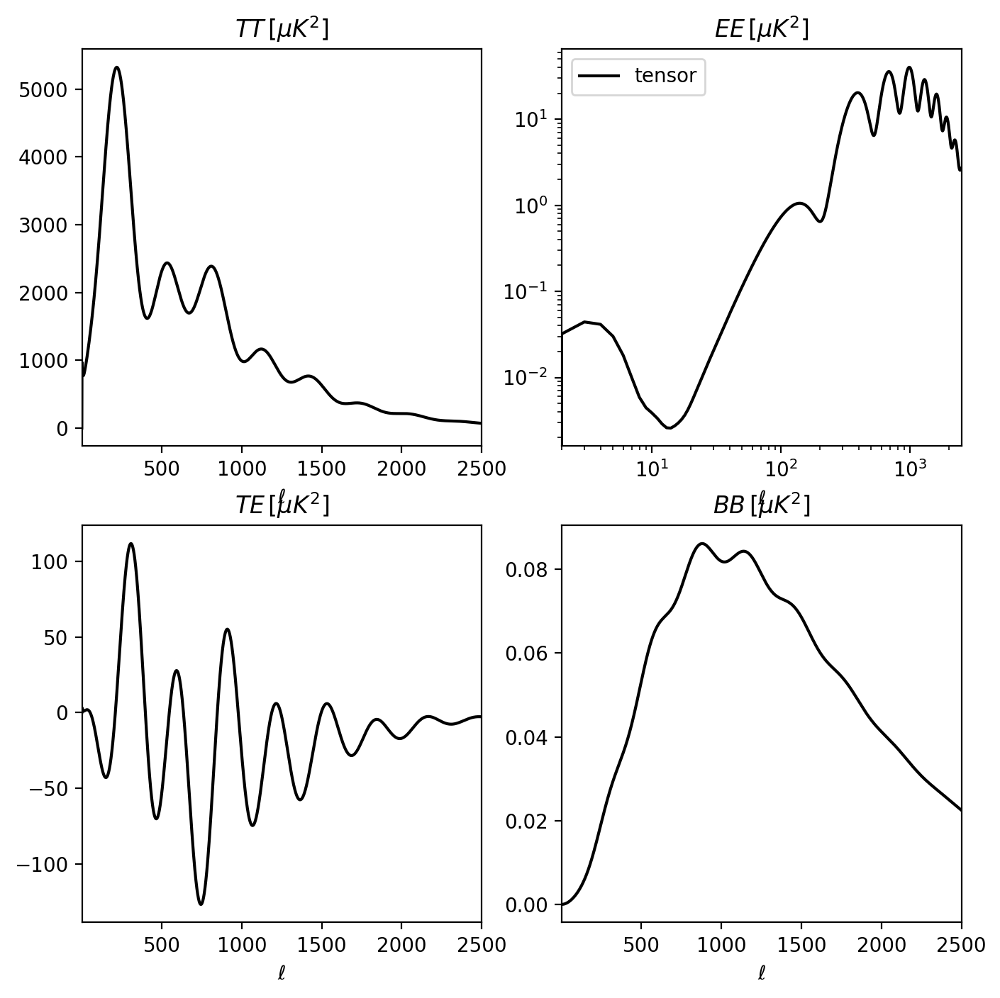

In [4]:
#plot the total lensed CMB power spectra versus unlensed, and fractional difference

ls = np.arange(TT_ps.shape[0])
fig, ax = plt.subplots(2,2, figsize = (8,8))

# TT
ax[0,0].plot(ls,TT_ps, color='k')
ax[0,0].set_title(r'$TT\, [\mu K^2]$')

#TE
ax[1,0].plot(ls,TE_ps, color='k')
ax[1,0].set_title(r'$TE\, [\mu K^2]$')

#EE
ax[0,1].loglog(ls,EE_ps, color='k', label="tensor")
ax[0,1].set_title(r'$EE\, [\mu K^2]$')
ax[0,1].legend()

# BB
ax[1,1].plot(ls,BB_ps, color='k')
ax[1,1].set_title(r'$BB\, [\mu K^2]$')

for ax in ax.reshape(-1): 
    ax.set_xlim([2,2500])
    ax.set_xlabel(r'$\ell$')

# Mappe

In [6]:
# parametri mappa

pix_size         = 0.5                              #arcmin
N                = 2**10                            #num pixel lineare
X_width, Y_width = N*pix_size/60., N*pix_size/60.   #dimensioni mappa in gradi
Nsqdeg           = X_width**2

c_min, c_max     = -200, 200                        #color map



#se voglio invece partire da una dimensione fissata di mappa e pixel, uso questa formula per trovare quanti pixel mi servono
#N = (X_width * 60)/ pix_size #pixel number



print(f"Mappa con {N} x {N} pixels, ognuno di {pix_size} arcmin, per una dimensione totale di {X_width:.2f} x {Y_width:.2f} gradi")


nbig = 5000

Mappa con 1024 x 1024 pixels, ognuno di 0.5 arcmin, per una dimensione totale di 8.53 x 8.53 gradi


In [24]:
# MAPPE ORIGINALI

ell_big = np.arange(nbig)

TT_ps_big = np.zeros(nbig)
TT_ps_big[ls.astype(int)] = TT_ps

EE_ps_big = np.zeros(nbig)
EE_ps_big[ls.astype(int)] = EE_ps

BB_ps_big = np.zeros(nbig)
BB_ps_big[ls.astype(int)] = BB_ps

TE_ps_big = np.zeros(nbig)
TE_ps_big[ls.astype(int)] = TE_ps

ell    = ell_big
ps_TT  = TT_ps_big + 1e-3   
ps_EE  = EE_ps_big + 1e-3
ps_BB  = BB_ps_big + 1e-3
ps_TE  = TE_ps_big

Temp_point_source_spectrum = ps_TT[1000]*(ell/3000.)**2.
Pol_point_source_spectrum  = ps_EE[1500]*(ell/4500.)**2.

ps_TT = ps_TT + Temp_point_source_spectrum  
ps_EE = ps_EE + Pol_point_source_spectrum
ps_BB = ps_BB + Pol_point_source_spectrum

# mappe originali
T_map, Q_map, U_map, E_map, B_map = make_CMB_maps(N,pix_size,ell,ps_TT,ps_EE,ps_TE,ps_BB)

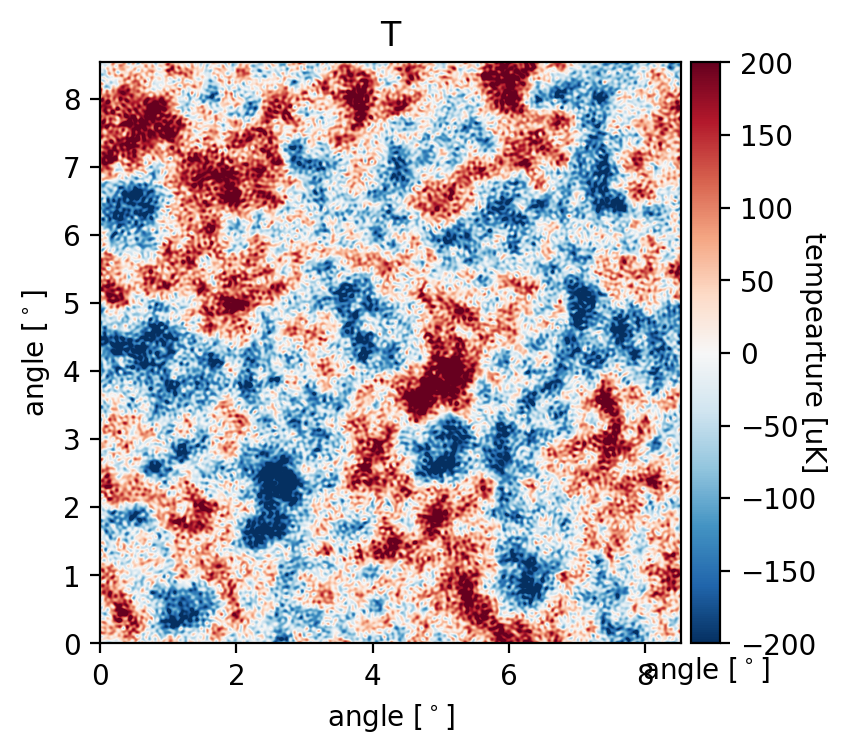

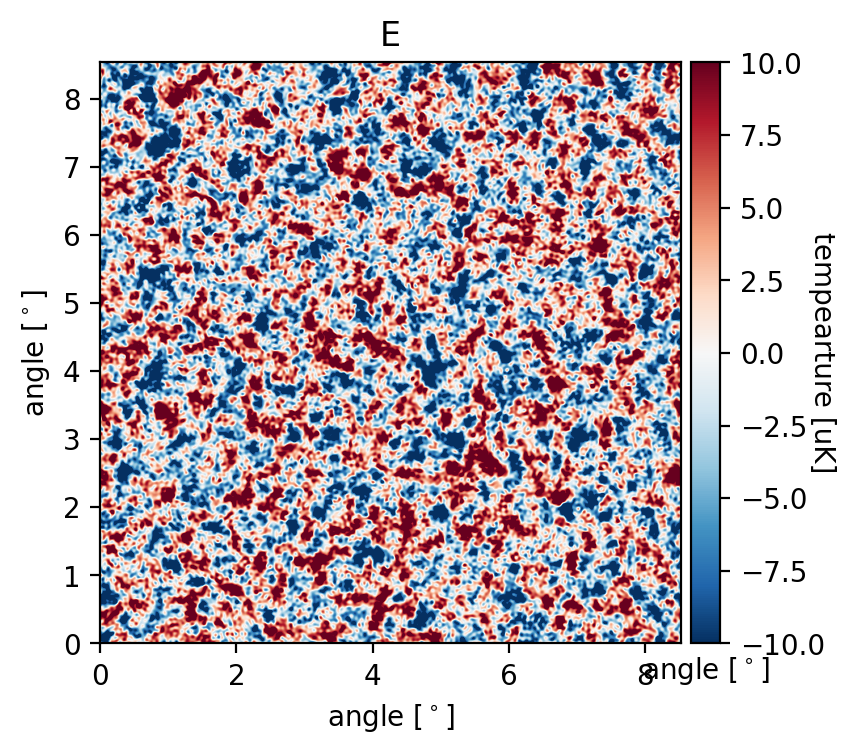

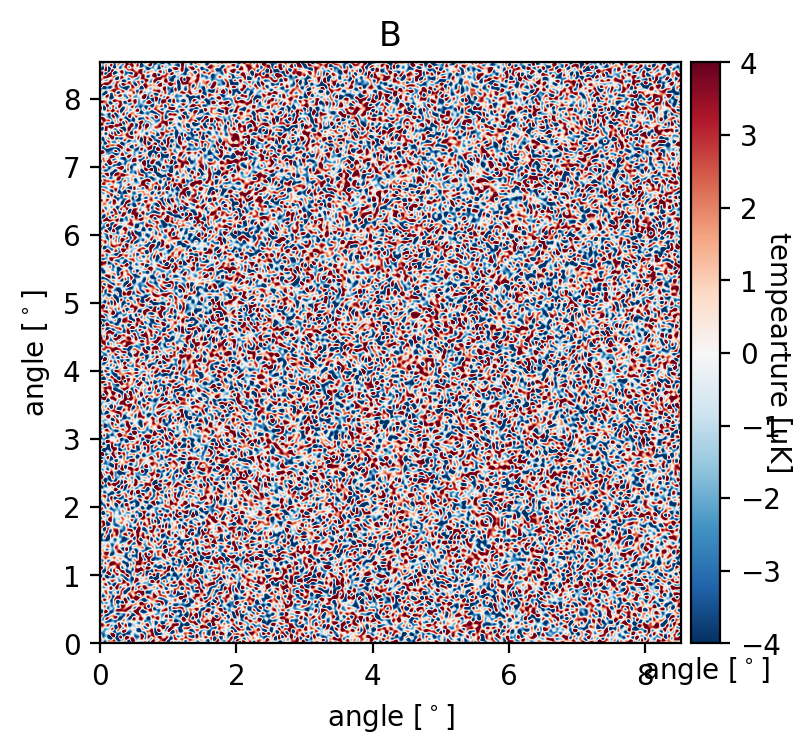

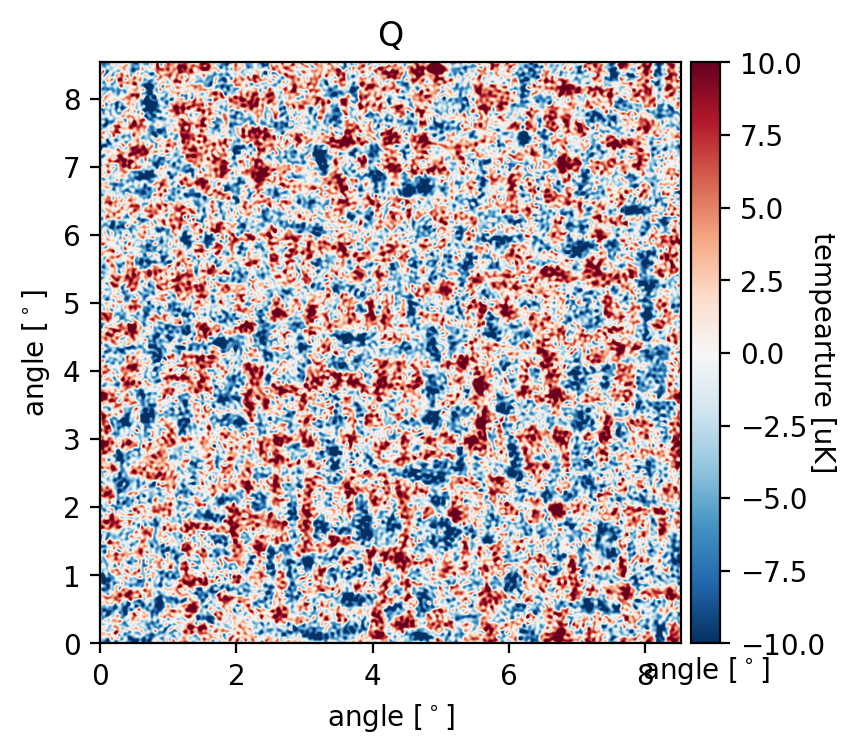

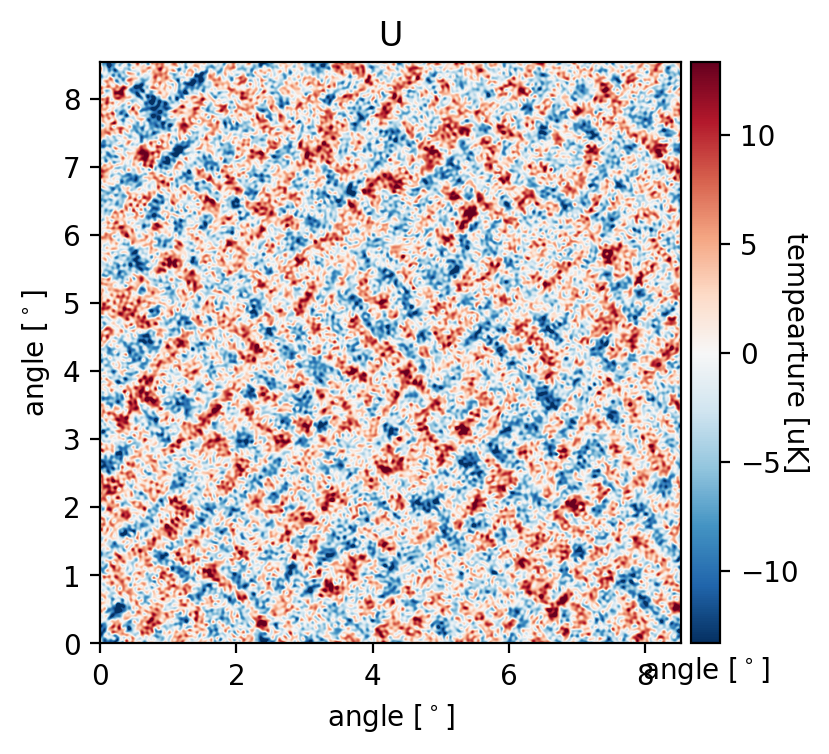

In [25]:
# MAPPE ORIGINALI

plt.title("T")
plt.ylabel('angle $[^\circ]$')
plt.xlabel('angle $[^\circ]$')
p = Plot_CMB_Map(T_map,c_min,c_max,X_width,Y_width)

plt.title("E")
plt.ylabel('angle $[^\circ]$')
plt.xlabel('angle $[^\circ]$')
p = Plot_CMB_Map(E_map,c_min/20.,c_max/20.,X_width,Y_width)

plt.title("B")
plt.ylabel('angle $[^\circ]$')
plt.xlabel('angle $[^\circ]$')
p = Plot_CMB_Map(B_map,c_min/50.,c_max/50.,X_width,Y_width)

plt.title("Q")
plt.ylabel('angle $[^\circ]$')
plt.xlabel('angle $[^\circ]$')
p = Plot_CMB_Map(Q_map ,c_min/20.,c_max/20.,X_width,Y_width)

plt.title("U")
plt.ylabel('angle $[^\circ]$')
plt.xlabel('angle $[^\circ]$')
p = Plot_CMB_Map(U_map,c_min/15.,c_max/15.,X_width,Y_width)

# Beam - Notebook 1

https://github.com/McMahonCosmologyGroup/cmbInstrumentSummerSchool/blob/main/Notebook2_beam_systematics.ipynb

ellipticity =  -0.36507936507936506


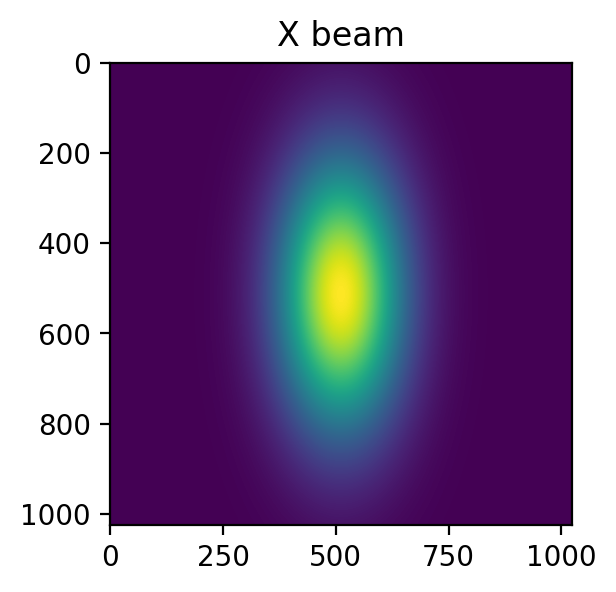

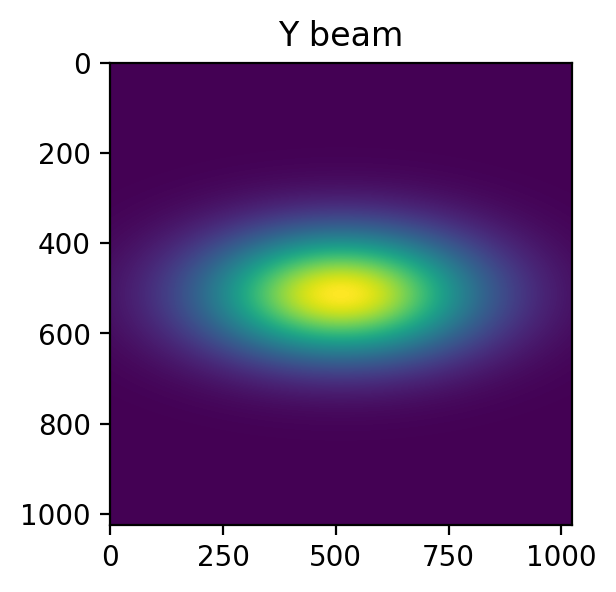

In [26]:
# ESEMPIO PRESO DAL NOTEBOOK CON SOLO BEAM CENTRALE


#gaussians parameters (ellipical 2D gaussian)
FWHM_x = 20  # degrees
FWHM_y = 43  # degrees
print("ellipticity = ", (FWHM_x - FWHM_y) / (FWHM_x + FWHM_y))

x = np.linspace(-44.5, 44.5, N)  # degrees
y = np.linspace(-44.5, 44.5, N)  # degrees
x_1, y_1 = np.meshgrid(x, -1 * y)

#Relazione FWHM- std dev in una gaussiana: FWHM = 2 * sqrt(2*ln(2)) * dev_std, quindi qui trovo la deviazione std
wx = FWHM_x / np.sqrt(2 * np.log(2))
wy = FWHM_y / np.sqrt(2 * np.log(2))



# x-polarization : distribuzione gaussiana 2D nel piano (x, y) con asse di simmetria lungo l'asse x, e con larghezze
# determinate dalle deviazioni standard 
beam_un_x = np.exp(-2 * (x_1**2 / wx**2 + y_1**2 / wy**2))
# normalize
beam_x = beam_un_x / np.max(beam_un_x)

plt.figure(figsize=(3,3))
plt.imshow(beam_x)
plt.title("X beam")
plt.show()



# y-polarization
beam_un_y = np.exp(-2 * (y_1**2 / wx**2 + x_1**2 / wy**2))
# normalize
beam_y = beam_un_y / np.max(beam_un_y)

plt.figure(figsize=(3,3))
plt.imshow(beam_y)
plt.title("Y beam")
plt.show()

## Beam + rings

In [27]:
#@interact(azimuth=(0, 360, 1), elevation=(0, 90, 1))
def plot_3d_gaussian(x, y, result, azimuth, elevation, title):
    from ipywidgets import interactive, interact, fixed
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.plot_surface(x, y, result, cmap='viridis')
    ax.set_title(title)
    #ax.set_xlabel('X (degrees)')
    #ax.set_ylabel('Y (degrees)')
    #ax.set_zlabel('Normalized Intensity')

    ax.view_init(elev=elevation, azim=azimuth)

    plt.show()
    
#plot_3d_gaussian(x_1, y_1, result, azimuth=45, elevation=30)

ellipticity =  -0.2


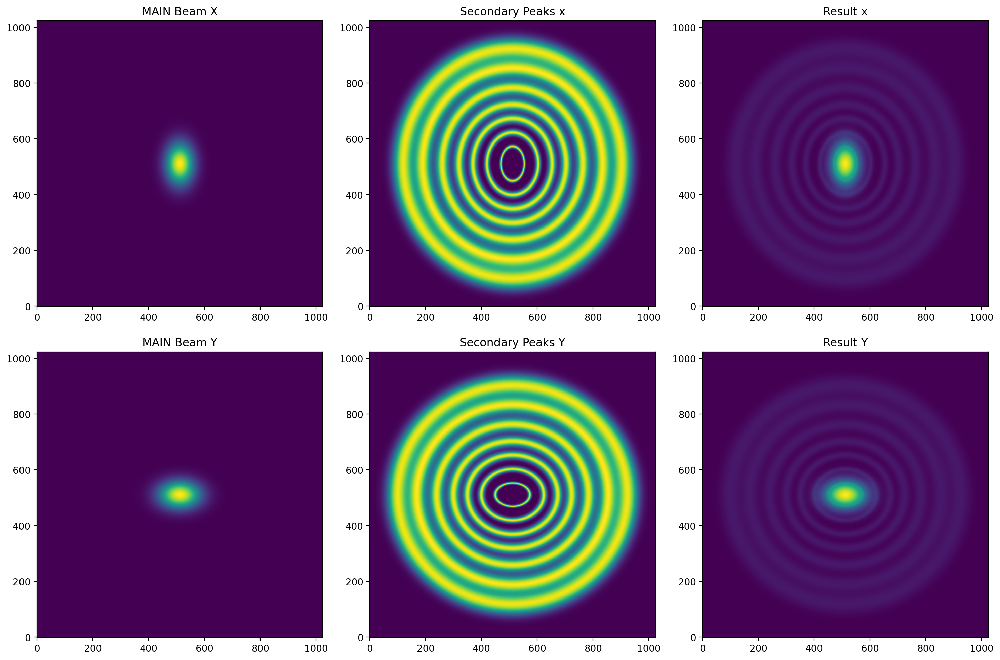

In [8]:
# BEAM CENTRALE + ANELLI SECONDARI CON SISTEMA DI COORDINATE UGUALE A QUELLO DELLE MAPPE


# COORDINATE COME NELLE MAPPE

N = int(N)
ones = np.ones(N)
inds = (np.arange(N)+.5 - N/2.) * pix_size
X = np.outer(ones,inds)
Y = np.transpose(X)
R = np.sqrt(X**2. + Y**2.)


#####################################################################################

# MAIN BEAM

# Parametri della gaussiana ellittica centrale
FWHM_x = 40  # degrees
FWHM_y = 60  # degrees
print("ellipticity = ", (FWHM_x - FWHM_y) / (FWHM_x + FWHM_y))

#Relazione FWHM-std dev in una gaussiana: FWHM = 2 * sqrt(2*ln(2)) * dev_std, quindi qui trovo la deviazione std
wx = FWHM_x / np.sqrt(2 * np.log(2))
wy = FWHM_y / np.sqrt(2 * np.log(2))


# x-polarization : distribuzione gaussiana 2D nel piano (x, y) con asse di simmetria lungo l'asse x, e con larghezze
# determinate dalle deviazioni standard 
beam_x = np.exp(-2 * (X**2 / wx**2 + Y**2 / wy**2))

# y-polarization  
beam_y = np.exp(-2 * (Y**2 / wx**2 + X**2 / wy**2))


##########################################################################################

# SECONDARY PEAKS

a_values = [25, 50, 75, 100, 130, 165, 200] # minor semi-axis
b_values = [35, 60, 85, 110, 140, 175, 210] # major semi-axis


#P(dB) = 10 * log10 (P_anello/P_picco_centrale). --> P_anello = 10**(P(dB)/10) * P_picco _centrale
P_anellox = np.mean(beam_x)/20 
P_anelloy = np.mean(beam_y)/20 
dB_x = -(10 * np.log10(P_anellox/np.max(beam_x)))
dB_y = -(10 * np.log10(P_anelloy/np.max(beam_y)))


# HO MESSO UN MENO SE NO SONO NEGATIVI E VIENE UN PICCO CENTRALE INVECE DI LASCIARE IL BUCO PER IL MAIN BEAM
#dB_x = -(10 * np.log10(np.max(beam_x)) )
#dB_y = -(10 * np.log10(np.max(beam_x)) )

sec_rings_x = np.zeros_like(X)
sec_rings_y = np.zeros_like(Y)

for a, b in zip(a_values, b_values):
    distance_x   = np.sqrt((X / (a-4))**2 + (Y / (b-4))**2) # ellissi x
    distance_y   = np.sqrt((X / (b-4))**2 + (Y / (a-4))**2) # ellissi y
        
    sec_rings_x += dB_x * np.exp(-(distance_x - 1)**2 / 0.008) # altezza anelli/ fattore di smoothing (più è piccolo più definiti gli anelli)
    sec_rings_y += dB_y * np.exp(-(distance_y - 1)**2 / 0.008)
    
sec_rings_x = sec_rings_x / 500 # cambio l'altezza !!!!!!!!!!!!!!!!!!
sec_rings_y = sec_rings_y / 500 # cambio l'altezza

#########################################################################################

# TOTALE

# Aggiungo sec_rings al main beam
beam_x_real = beam_x + sec_rings_x
beam_y_real = beam_y + sec_rings_y

# Normalizzazione del risultato
beam_x_real /= np.max(beam_x_real)
beam_y_real /= np.max(beam_y_real)


########################################################################################

# PLOT

fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# X
# Main Beam
axes[0][0].imshow(beam_x, cmap='viridis', origin='lower')
axes[0][0].set_title('MAIN Beam X')
#axes[0][0].set_xlabel('')
#axes[0][0].set_ylabel('')


# Sec peaks
axes[0][1].imshow(sec_rings_x, cmap='viridis', origin='lower')
axes[0][1].set_title('Secondary Peaks x')
#axes[0][1].set_xlabel('')
#axes[0][1].set_ylabel('')


# Result
im = axes[0][2].imshow(beam_x_real, cmap='viridis', origin='lower')
axes[0][2].set_title('Result x')
#axes[0][2].set_xlabel('')
#axes[0][2].set_ylabel('')


# Y
# Main Beam
axes[1][0].imshow(beam_y, cmap='viridis', origin='lower')
axes[1][0].set_title('MAIN Beam Y')
#axes[1][0].set_xlabel('')
#axes[1][0].set_ylabel('')


# Sec peaks
axes[1][1].imshow(sec_rings_y, cmap='viridis', origin='lower')
axes[1][1].set_title('Secondary Peaks Y')
#axes[1][1].set_xlabel('')
#axes[1][1].set_ylabel('')


# Result
im = axes[1][2].imshow(beam_y_real, cmap='viridis', origin='lower')
axes[1][2].set_title('Result Y')
#axes[1][2].set_xlabel('')
#axes[1][2].set_ylabel('')

plt.tight_layout()
#plt.subplots_adjust(wspace=0.25, hspace=0.2, top=0.90)
plt.show()

In [9]:
beam_x

array([[7.90651309e-72, 1.23102792e-71, 1.91502535e-71, ...,
        1.91502535e-71, 1.23102792e-71, 7.90651309e-72],
       [9.62596028e-72, 1.49874234e-71, 2.33149022e-71, ...,
        2.33149022e-71, 1.49874234e-71, 9.62596028e-72],
       [1.17148275e-71, 1.82397469e-71, 2.83743179e-71, ...,
        2.83743179e-71, 1.82397469e-71, 1.17148275e-71],
       ...,
       [1.17148275e-71, 1.82397469e-71, 2.83743179e-71, ...,
        2.83743179e-71, 1.82397469e-71, 1.17148275e-71],
       [9.62596028e-72, 1.49874234e-71, 2.33149022e-71, ...,
        2.33149022e-71, 1.49874234e-71, 9.62596028e-72],
       [7.90651309e-72, 1.23102792e-71, 1.91502535e-71, ...,
        1.91502535e-71, 1.23102792e-71, 7.90651309e-72]])

In [29]:
plot_x = interactive(plot_3d_gaussian, x=fixed(x_1), y=fixed(y_1), result=fixed(beam_x_real), azimuth=(0, 360, 1),
         elevation=(0, 90, 1), title ="Beam X")
plot_y = interactive(plot_3d_gaussian, x=fixed(x_1), y=fixed(y_1), result=fixed(beam_y_real), azimuth=(0, 360, 1),
         elevation=(0, 90, 1), title ="Beam Y")

display(plot_x)
display(plot_y)

interactive(children=(IntSlider(value=180, description='azimuth', max=360), IntSlider(value=45, description='e…

interactive(children=(IntSlider(value=180, description='azimuth', max=360), IntSlider(value=45, description='e…

## Convolvo beam con mappa

In [30]:
def convolve_map_with_beam(N,pix_size,beam_x,beam_y, Map):
    
    #FT
    FT_Map    = np.fft.fft2(Map)
    FT_beam_x = np.fft.fft2(beam_x)
    FT_beam_y = np.fft.fft2(beam_y)
    
    # CONVOLUZIONE 
    convolved_map_x = FT_beam_x*FT_Map
    convolved_map_y = FT_beam_y*FT_Map
    
    #combined_map_fourier = np.sqrt(np.abs(convolved_map_x)**2 + np.abs(convolved_map_y)**2) # TOTALE
    combined_beam_fourier = FT_beam_x + FT_beam_y
    combined_map_fourier = FT_Map * combined_beam_fourier

    # REALE
    combined_map_real = np.fft.ifft2(combined_map_fourier)
    combined_map_real = np.real(combined_map_real)

    combined_beam_real = np.fft.ifft2(combined_beam_fourier)
    combined_beam_real = np.real(combined_beam_real)
    

    convolved_map_x_real =  np.fft.ifft2(convolved_map_x)
    convolved_map_x_real = np.real(convolved_map_x_real)
    
    convolved_map_y_real =  np.fft.ifft2(convolved_map_y)
    convolved_map_y_real = np.real(convolved_map_y_real)
    
    
    return(combined_map_real, combined_beam_real, convolved_map_x_real, convolved_map_y_real)

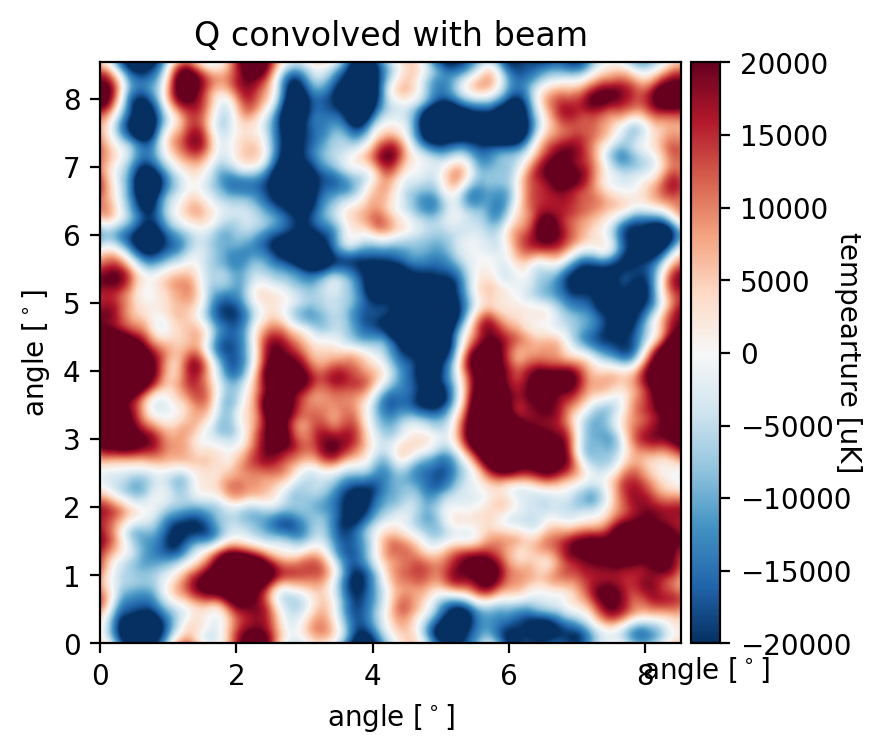

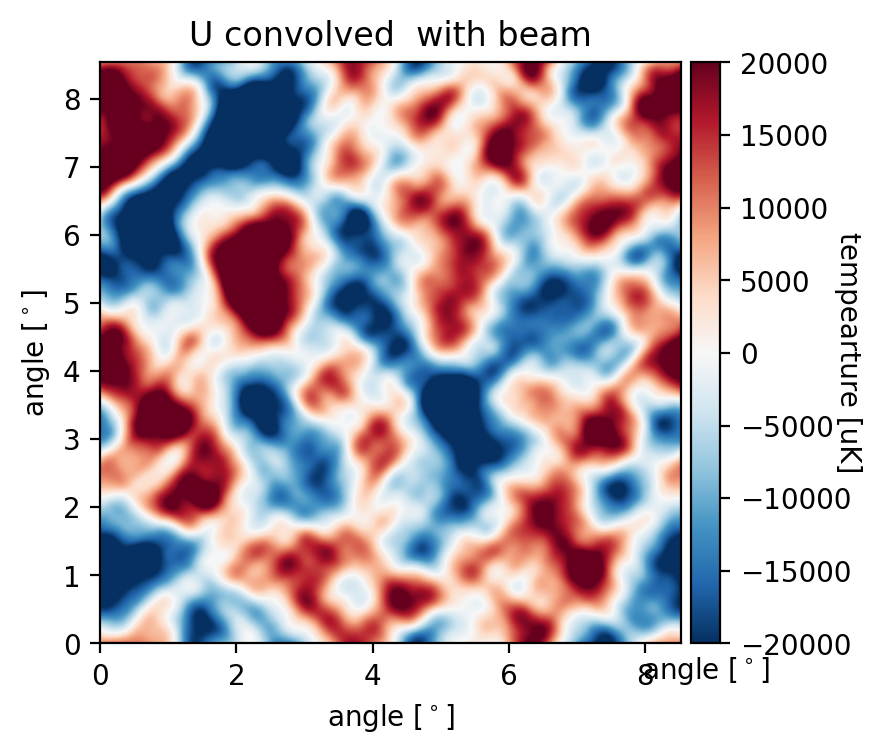

In [31]:
# MAPPE NELLO SPAZIO REALE
Q_map_convolved, beam_tot, Qx_conv, Qy_conv = convolve_map_with_beam(N,pix_size,beam_x_real,beam_y_real, Q_map)
U_map_convolved, beam_tot, Ux_conv, Uy_conv = convolve_map_with_beam(N,pix_size,beam_x_real,beam_y_real, U_map)

plt.title("Q convolved with beam")
plt.ylabel('angle $[^\circ]$')
plt.xlabel('angle $[^\circ]$')
p = Plot_CMB_Map(Q_map_convolved,c_min*100,c_max*100,X_width,Y_width)

plt.title("U convolved  with beam")
plt.ylabel('angle $[^\circ]$')
plt.xlabel('angle $[^\circ]$')
p = Plot_CMB_Map(U_map_convolved,c_min*100,c_max*100,X_width,Y_width)

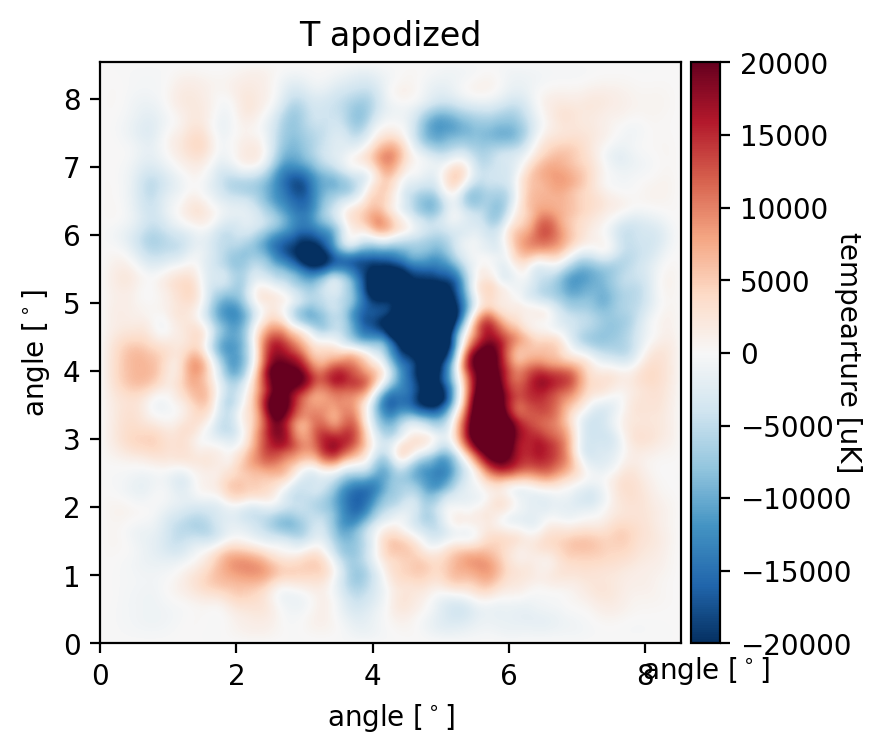

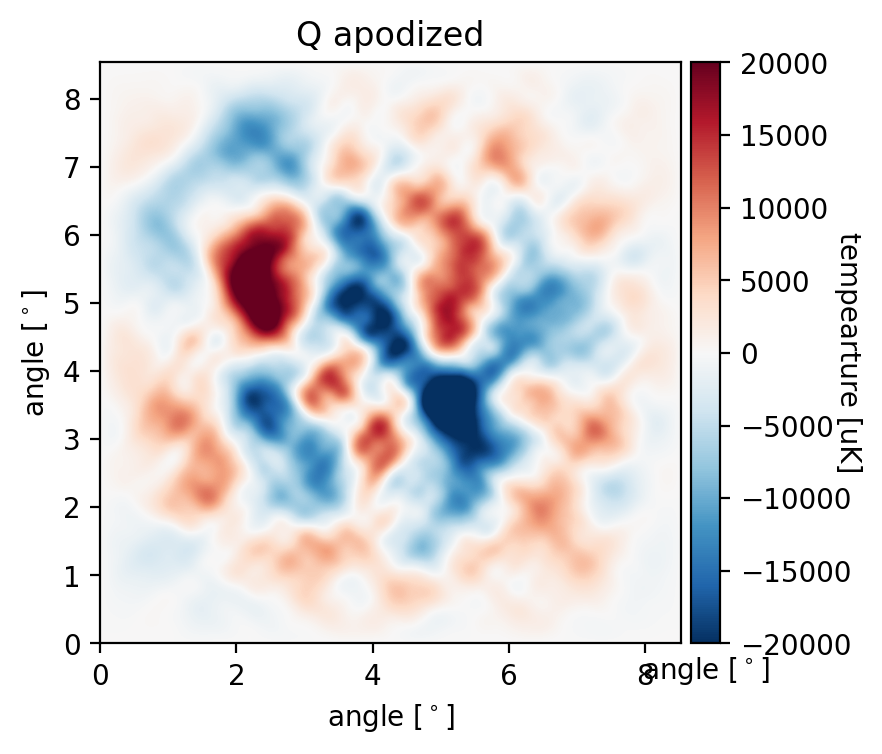

In [32]:
# APODIZZAZIONE
window = (cosine_window(N))

Q_map_convolved = window * Q_map_convolved
U_map_convolved = window * U_map_convolved


plt.title("T apodized")
plt.ylabel('angle $[^\circ]$')
plt.xlabel('angle $[^\circ]$')
p = Plot_CMB_Map(Q_map_convolved,c_min*100,c_max*100,X_width,Y_width)

plt.title("Q apodized")
plt.ylabel('angle $[^\circ]$')
plt.xlabel('angle $[^\circ]$')
p = Plot_CMB_Map(U_map_convolved,c_min*100,c_max*100,X_width,Y_width)


# ANALISI

Deconvolvo, passo da QU a EB e faccio spettri

### Deconvoluzione

In [33]:
# da MAPEXT ( https://github.com/tjrennie/MAPEXT)
def richardson_lucy(image, psf, im_deconv=None, num_iter=1, clip=False, 
                     filter_epsilon=False, eps=1e-12, progress=False):
    
    if im_deconv is None:
        im_deconv = np.full(image.shape, 0.5, dtype=float)
    
    psf_mirror = np.flip(psf)
    
    if progress:
        iter_range = tqdm(range(num_iter)) if not progress == 'notebook' else tqdm_notebook(range(num_iter))
    else:
        iter_range = range(num_iter)
        
    for i in iter_range:
        conv = convolve(im_deconv, psf, mode='same') + eps
        if filter_epsilon:
            relative_blur = np.where(conv < filter_epsilon, 0, image / conv)
        else:
            relative_blur = image / conv
        
        im_deconv *= convolve(relative_blur, psf_mirror, mode='same')
        
        
    return im_deconv

In [34]:
# ci mette un po'


# deconvolvo la mappa x dal beam x e la y dal beam y
#Qx_deconv = richardson_lucy(Qx_conv, beam_x_real, im_deconv=None, num_iter=50,clip=True, filter_epsilon=True, eps=1e-12, progress=True)
#Qy_deconv = richardson_lucy(Qy_conv, beam_y_real, im_deconv=None, num_iter=50,clip=True, filter_epsilon=True, eps=1e-12, progress=True)

#Ux_deconv = richardson_lucy(Ux_conv, beam_x_real, im_deconv=None, num_iter=50,clip=True, filter_epsilon=True, eps=1e-12, progress=True)
#Uy_deconv = richardson_lucy(Uy_conv, beam_y_real, im_deconv=None, num_iter=50,clip=True, filter_epsilon=True, eps=1e-12, progress=True)


Q_deconv = richardson_lucy(Q_map_convolved, beam_tot, im_deconv=None, num_iter=50,clip=True, filter_epsilon=True, eps=1e-12, progress=True)
U_deconv = richardson_lucy(U_map_convolved, beam_tot, im_deconv=None, num_iter=50,clip=True, filter_epsilon=True, eps=1e-12, progress=True)

100%|██████████| 50/50 [01:03<00:00,  1.26s/it]


In [35]:
# LE MATRICI SONO DIVISE IN X E Y, LE UNISCO 
#Q_deconv = np.sqrt(Qx_deconv**2 +Qy_deconv**2)
#U_deconv = np.sqrt(Ux_deconv**2 + Uy_deconv**2)

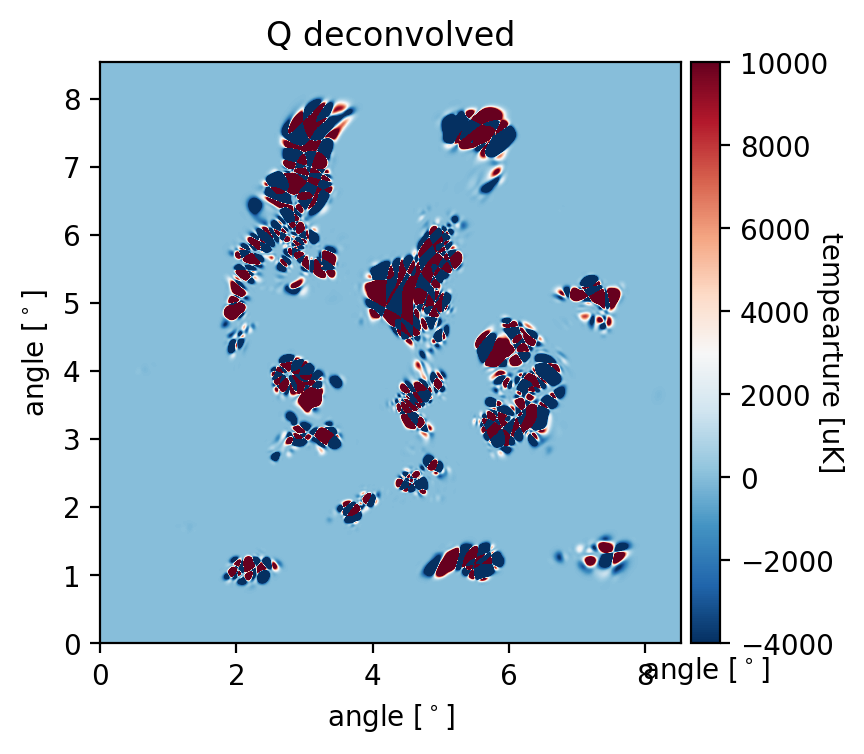

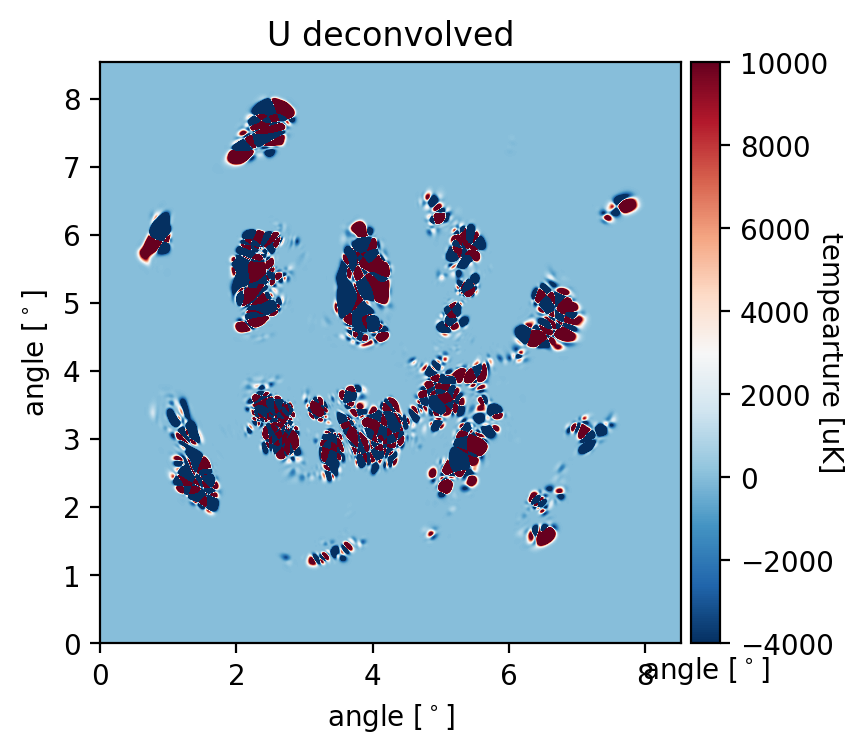

In [36]:
plt.title("Q deconvolved")
plt.ylabel('angle $[^\circ]$')
plt.xlabel('angle $[^\circ]$')
p = Plot_CMB_Map(Q_deconv,c_min*20,c_max*50,X_width,Y_width)

plt.title("U deconvolved")
plt.ylabel('angle $[^\circ]$')
plt.xlabel('angle $[^\circ]$')
p = Plot_CMB_Map(U_deconv,c_min*20,c_max*50,X_width,Y_width)

### Da QU deconvolved a EB

In [37]:
window = (cosine_window(N))

E_deconv, B_deconv = QU2EB(N,pix_size,Q_deconv * window,U_deconv * window)

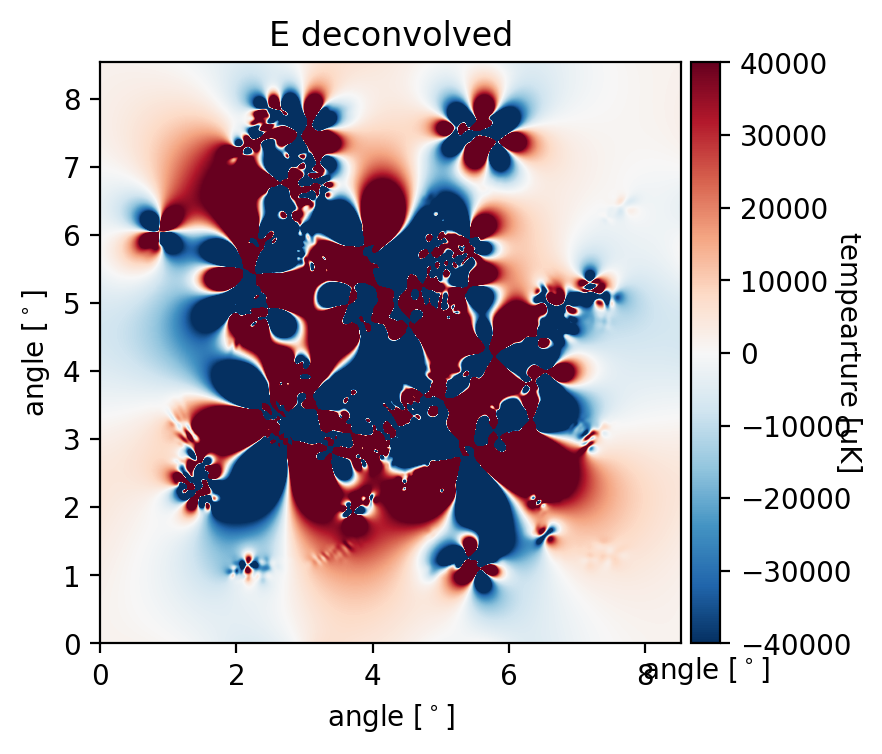

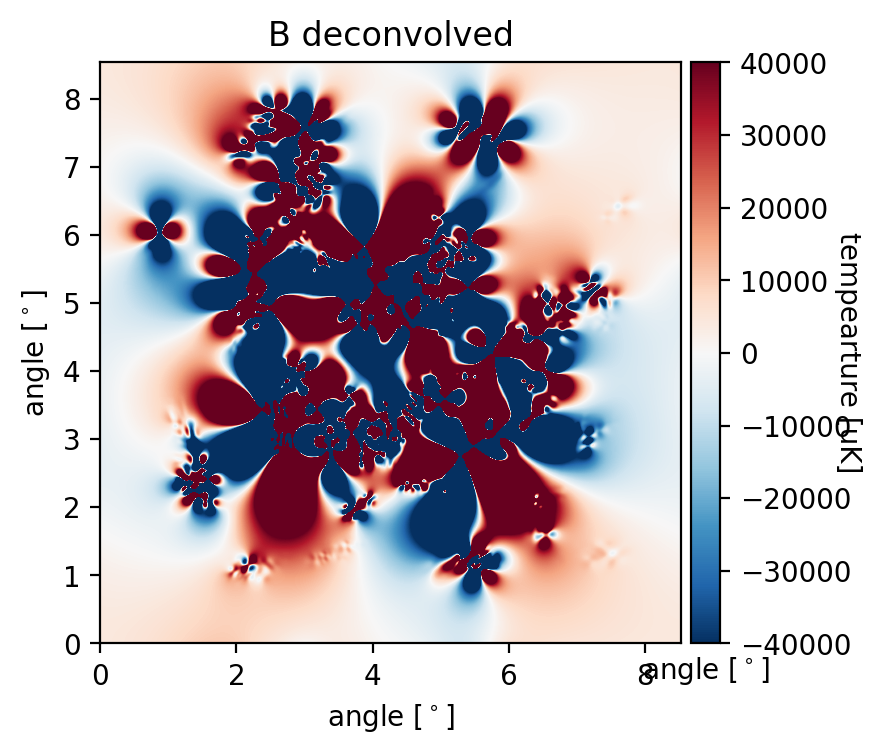

In [38]:
plt.title("E deconvolved")
plt.ylabel('angle $[^\circ]$')
plt.xlabel('angle $[^\circ]$')
p = Plot_CMB_Map(E_deconv,c_min*200,c_max*200,X_width,Y_width)

plt.title("B deconvolved")
plt.ylabel('angle $[^\circ]$')
plt.xlabel('angle $[^\circ]$')
p = Plot_CMB_Map(B_deconv,c_min*200,c_max*200,X_width,Y_width)

### PS

In [39]:
delta_l = 50.
l_max   = 2500

binned_l_E_deconv, binned_spectrum_E_deconv = calculate_2d_spectrum(E_deconv,E_deconv,delta_l,l_max,pix_size,N)
binned_l_B_deconv, binned_spectrum_B_deconv = calculate_2d_spectrum(B_deconv,B_deconv,delta_l,l_max,pix_size,N)

In [40]:
# ci mette un po' (un paio di minuti)

beam_size_fwhp    = 1.25
white_noise_level = 0.5
atmospheric_noise_level = 0.1 * 0 #azzerato
one_over_f_noise_level  = 0.2 * 0 #azzerato

# TRANSFER FUNCTION - multiplicative bias
N_iterations  = 16
signal_only_E_deconv = np.zeros([N_iterations,int(l_max/delta_l)])
signal_only_B_deconv = np.zeros([N_iterations,int(l_max/delta_l)])

i = 0

while (i < N_iterations):
         
    map_convolved_E_deconv = convolve_map_with_gaussian_beam(N,pix_size,beam_size_fwhp,E_deconv)
    map_convolved_B_deconv = convolve_map_with_gaussian_beam(N,pix_size,beam_size_fwhp,B_deconv)
    
    binned_l_cur_E_deconv, binned_spectrum_cur_E_deconv = calculate_2d_spectrum(map_convolved_E_deconv*window, map_convolved_E_deconv*window,delta_l,l_max,pix_size,N)
    binned_l_cur_B_deconv, binned_spectrum_cur_B_deconv = calculate_2d_spectrum(map_convolved_B_deconv*window, map_convolved_B_deconv*window,delta_l,l_max,pix_size,N)
    
    
    signal_only_E_deconv[i,:] = binned_spectrum_cur_E_deconv
    sys.stdout.flush()
    signal_only_B_deconv[i,:] = binned_spectrum_cur_B_deconv
    sys.stdout.flush()
    i = i + 1
    
sig_only_mean_spectrum_E_deconv, rms_E_deconv = average_N_spectra(signal_only_E_deconv,N_iterations,int(l_max/delta_l))
sig_only_mean_spectrum_B_deconv, rms_B_deconv = average_N_spectra(signal_only_B_deconv,N_iterations,int(l_max/delta_l))

sub_sampled_CLs_E_deconv = Original_PS[2][binned_l_E_deconv] * 2. * np.pi / (binned_l_E_deconv * (binned_l_E_deconv+1.))
sub_sampled_CLs_B_deconv = Original_PS[3][binned_l_B_deconv] * 2. * np.pi / (binned_l_B_deconv * (binned_l_B_deconv+1.))

Multiplicative_Bias_est_E_deconv =  sub_sampled_CLs_E_deconv / sig_only_mean_spectrum_E_deconv
Multiplicative_Bias_est_B_deconv =  sub_sampled_CLs_B_deconv / sig_only_mean_spectrum_B_deconv



# NOISE - noise bias
noise_only = np.zeros([N_iterations,int(l_max/delta_l)])
i = 0

while (i <N_iterations):
    Noise = make_noise_map(N,pix_size,white_noise_level,atmospheric_noise_level,one_over_f_noise_level)
    binned_l_cur, binned_spectrum_cur = calculate_2d_spectrum(Noise*window,Noise*window,delta_l,l_max,pix_size,N)
    
    noise_only[i,:] = binned_spectrum_cur
    sys.stdout.flush()
    i = i + 1

noise_only_mean_spectrum, rms_not_needed = average_N_spectra(noise_only,N_iterations,int(l_max/delta_l))
Additive_Bias_est = noise_only_mean_spectrum

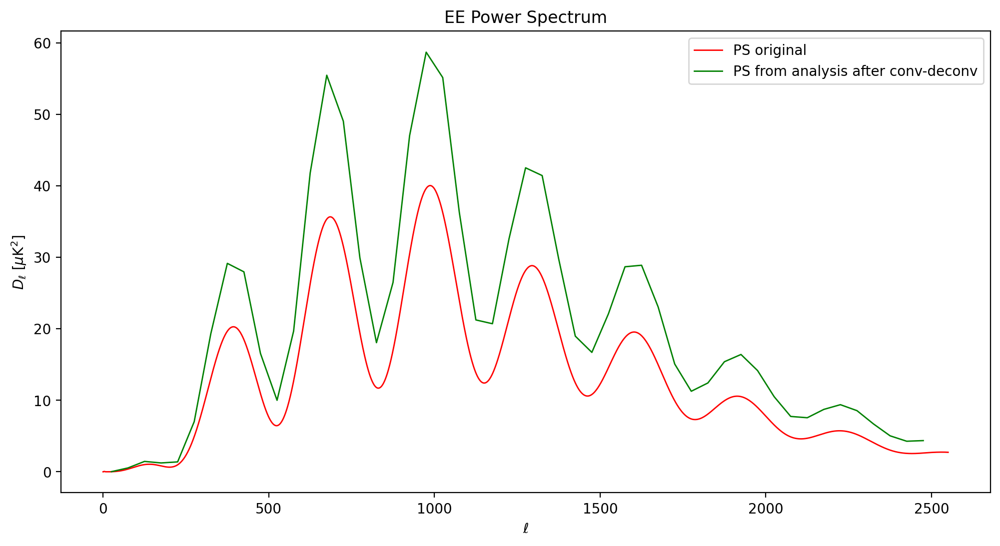

In [41]:
plt.figure(figsize=(12, 6))

plt.plot(ls,Original_PS[2], label="PS original", c="r", linewidth=1)

plt.plot(binned_l_E_deconv,(binned_spectrum_E_deconv - noise_only_mean_spectrum) * Multiplicative_Bias_est_E_deconv*\
             binned_l_E_deconv * (binned_l_E_deconv+1.)/2. / np.pi,color='green', label="PS from analysis after conv-deconv", linewidth=1)



plt.title("EE Power Spectrum")
plt.ylabel('$D_{\ell}$ [$\mu$K$^2$]')
plt.xlabel('$\ell$')
plt.legend()

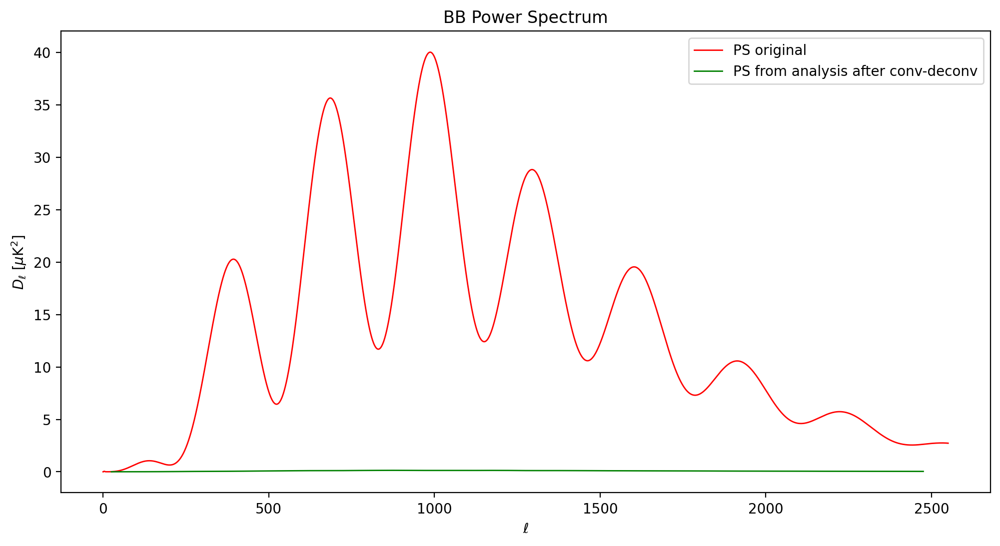

In [42]:
plt.figure(figsize=(12, 6))

plt.plot(ls,Original_PS[2], label="PS original", c="r", linewidth=1)

plt.plot(binned_l_B_deconv,(binned_spectrum_B_deconv - noise_only_mean_spectrum) * Multiplicative_Bias_est_B_deconv*\
             binned_l_B_deconv * (binned_l_B_deconv+1.)/2. / np.pi,color='green', label="PS from analysis after conv-deconv", linewidth=1)



plt.title("BB Power Spectrum")
plt.ylabel('$D_{\ell}$ [$\mu$K$^2$]')
plt.xlabel('$\ell$')
plt.legend()

# Altre cose del Notebook 1

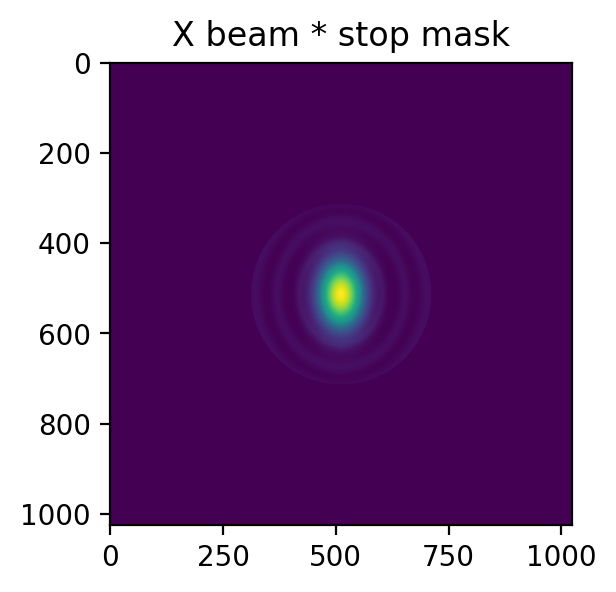

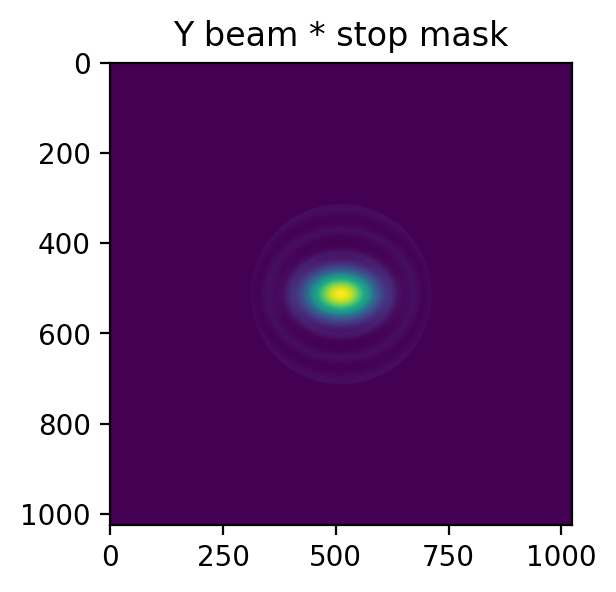

In [33]:
stop_angle = 200


# make a mask of the stop with 1 inside the stop and zero outside
#telecentricity = 0
#cen = 44.5
center = [512, 512]
radius = stop_angle
YY, XX = np.ogrid[:1024, :1024]
dist_from_center = np.sqrt((XX - center[0]) ** 2 + (YY - center[1]) ** 2)
mask = (dist_from_center <= radius) * 1

# multiply the beams by the mask
beam_x_stop = beam_x_real * mask
beam_y_stop = beam_y_real * mask

plt.figure(figsize=(3,3))
plt.imshow(beam_x_stop)
plt.title("X beam * stop mask")
plt.show()

plt.figure(figsize=(3,3))
plt.imshow(beam_y_stop)
plt.title("Y beam * stop mask")
plt.show()


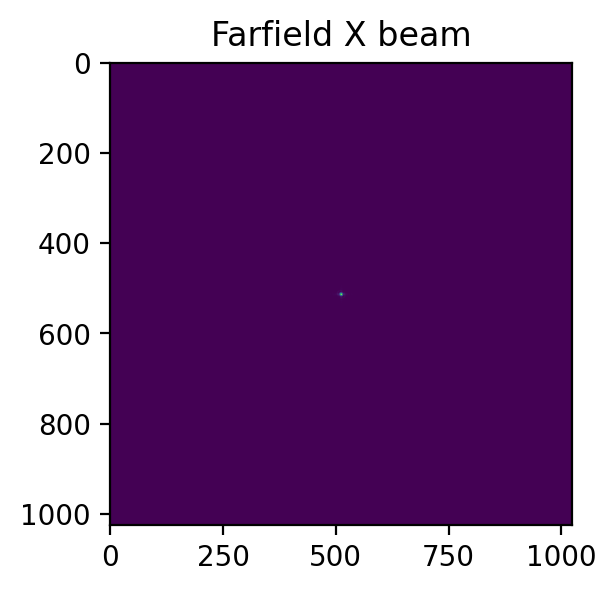

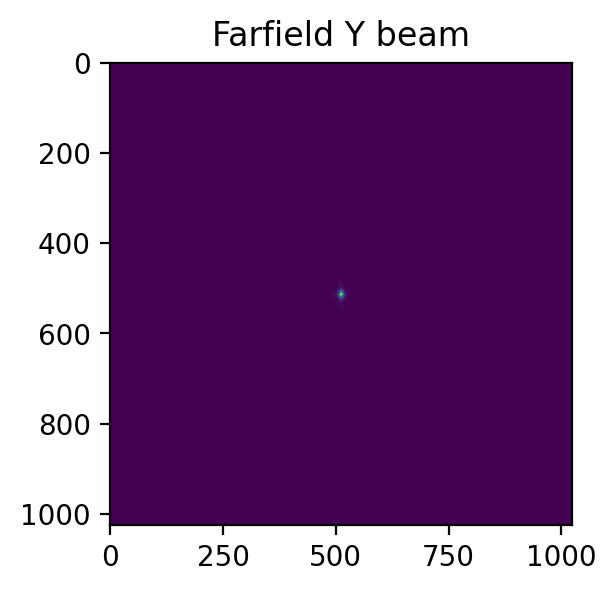

In [34]:
###Do a Fourier Transform to convolve the beam with the stop to get the farfield beam###

# fft shift the magnitude of the beam to the corners
beam_x_stop = np.fft.fftshift(np.sqrt(beam_x_stop)) 
beam_x_stop = np.fft.fftshift(np.sqrt(beam_x_stop))

# zero pad
n_pix  = 1024
n_half = int(n_pix / 2)
n_edge = n_pix - 256

magx = np.zeros((n_pix, n_pix))
magy = np.zeros((n_pix, n_pix))

magx[0:256, 0:256] = beam_x_stop[0:256, 0:256]
magx[0:256, n_edge:n_pix] = beam_x_stop[0:256, 256:512]
magx[n_edge:n_pix, 0:256] = beam_x_stop[256:512, 0:256]
magx[n_edge:n_pix, n_edge:n_pix] = beam_x_stop[256:512, 256:512]

magy[0:256, 0:256] = beam_y_stop[0:256, 0:256]
magy[0:256, n_edge:n_pix] = beam_y_stop[0:256, 256:512]
magy[n_edge:n_pix, 0:256] = beam_y_stop[256:512, 0:256]
magy[n_edge:n_pix, n_edge:n_pix] = beam_y_stop[256:512, 256:512]


# perform the FFT
fft_magx = np.fft.fft2(magx)
fft_magy = np.fft.fft2(magy)

# Ix e Iy
powx_fft    = np.real(fft_magx) ** 2 + np.imag(fft_magx) ** 2
beam_x_conv = np.fft.fftshift(powx_fft)
powy_fft    = np.real(fft_magy) ** 2 + np.imag(fft_magy) ** 2
beam_y_conv = np.fft.fftshift(powy_fft)


plt.figure(figsize=(3,3))
plt.imshow(beam_x_conv)
plt.title("Farfield X beam")
plt.show()

plt.figure(figsize=(3,3))
plt.imshow(beam_y_conv)
plt.title("Farfield Y beam")
plt.show()

### Leakage
To estimate the effect of the beams on the power spectrum, we will need to calculate the leakage beams. The electric fields on the sky $E_x$ and $E_y$ are coupled to the electric field in the detectors $E_a$ and $E_b$ by:

$$
  \begin{bmatrix}
  E_a\\
  E_b
  \end{bmatrix}
  =
  \begin{bmatrix}
  \beta_{ax} & \beta_{ay}\\
  \beta_{bx} & \beta_{by}
  \end{bmatrix}
  \begin{bmatrix}
  E_x\\
  E_y
  \end{bmatrix}
  \,\,\, , $$

where $a$ and $x$ as well as $b$ and $y$ are aligned along the telescope boresight. Here $\beta_{ax}$ and $\beta_{by}$ are the co-polar beams, and $\beta_{ay}$ and $\beta_{bx}$ are the cross-polar beams.

To measure the polarized signal $P$ from the CMB, we difference the two orthogonal polarization signals:
\begin{equation}
P=E_a^2-E_b^2 \,\,\,\,.
\end{equation}

The Stokes parameters using the decreasing phase convention are given by
$$\begin{align}
I & =  |E_{x}|^2+ |E_{y}|^2  \\
Q & =   |E_{x}|^2- |E_{y}|^2  \\
U & =  2\,\mathrm{Re}(E_{x} E_{y}^{*}) \\
V & =  2\,\mathrm{Im}(E_{x} E_{y}^{*})\,\,\,\,\,.
\end{align}$$
Here $I$ is the intensity, $Q$ and $U$ describe the linear polarization, and $V$ describes the circular polarization.

From this, we can derive the leakage beams:

$$P=\sigma I + \delta Q + \epsilon U+ \gamma V\,\,\,\, ,$$


where the coefficients are the beam couplings from $I$, $Q$, $U$, and $V$ into $P$. The beam couplings are then given by
\begin{align}
\sigma & =  \frac{1}{2} (\beta_{ax}^2 + \beta_{ay}^2 - \beta_{bx}^2 - \beta_{by}^2) \\ 
\delta & =   \frac{1}{2} (\beta_{ax}^2 - \beta_{ay}^2 - \beta_{bx}^2 + \beta_{by}^2) \\
\epsilon & =  \mathrm{Re}(\beta_{ax}^{*} \beta_{ay} - \beta_{bx}\beta_{by}^{*} )  \\
\gamma & =  -\mathrm{Im}(\beta_{ax} \beta_{ay}^{*} + \beta_{bx}^{*}\beta_{by} )\,\,\,\,\,.
\end{align}

$\sigma$ is the temperature to polarization leakage, $\delta$ is the polarized beam, $\epsilon$ is the E-mode to B-mode leakage, and $\gamma$ is the linear to circular polarization leakage.

Here is assumed that the cross-polar beams are rotationally symmetric, which means that $\beta_{ay}=\beta_{bx}$. Additionally, we will only look at the main beam $\delta$ and the temperature to polarization leakage beam $\sigma$ since the leakage from E-modes to B-mode and circular polarization is negligible.

Quindi
$$
  \begin{bmatrix}
  E_a\\
  E_b
  \end{bmatrix}
  =
  \begin{bmatrix}
  \beta_{ax} & \beta_{ay}\\
  \beta_{ay} & \beta_{by}
  \end{bmatrix}
  \begin{bmatrix}
  E_x\\
  E_y
  \end{bmatrix}
  \,\,\, , $$

\begin{align}
\sigma & =  \frac{1}{2} (\beta_{ax}^2  - \beta_{by}^2) \\ 
\delta & =   \frac{1}{2} (\beta_{ax}^2 + \beta_{by}^2) \\
\end{align}

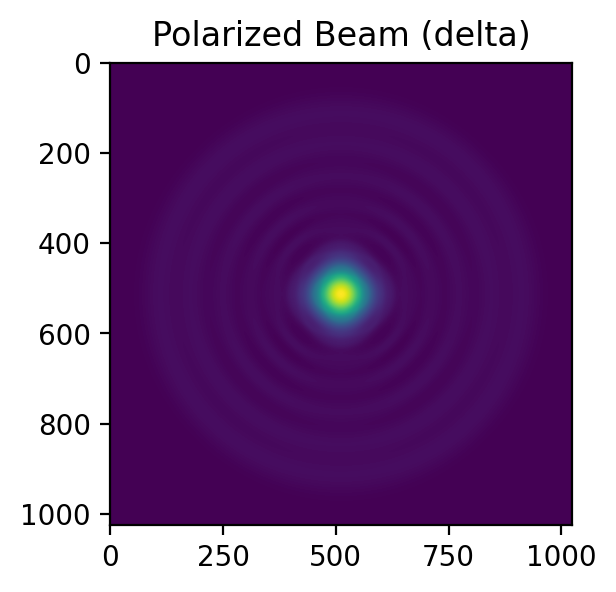

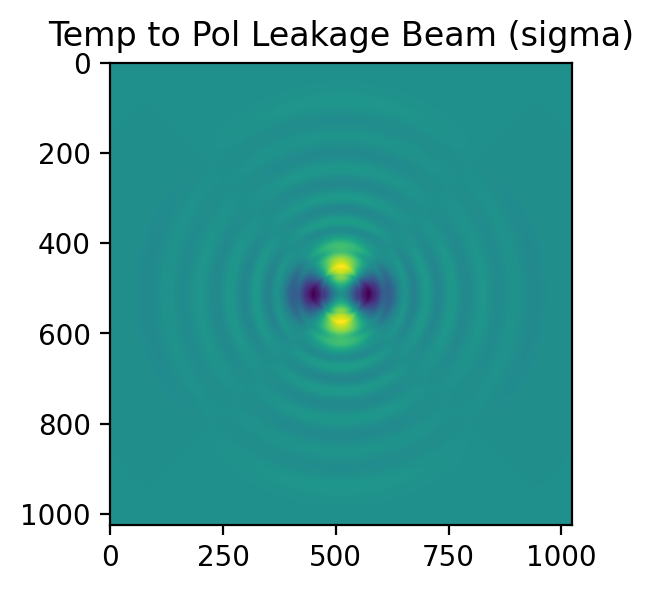

In [35]:
# USO IL BEAM INTERNO E NON QUELL CON LO STOP

# main beam (delta)
delta = 1 / 2 * (beam_x_real + beam_y_real)

plt.figure(figsize=(3,3))
plt.imshow(delta)
plt.title("Polarized Beam (delta)")
plt.show()



# Temperature to polarization leakage beam (sigma)
sigma = 1 / 2 * (beam_x_real - beam_y_real)

plt.figure(figsize=(3,3))
plt.imshow(sigma)
plt.title("Temp to Pol Leakage Beam (sigma)")
plt.show()

#the temperature to polarization leakage should be quadrupolar

To calculate the leakage into the power spectrum:
- estimate the *window function* of the beam by taking the Fourier Transform and then radially binning
- multiply this window function by the power spectra to estimate the effect of the beams.

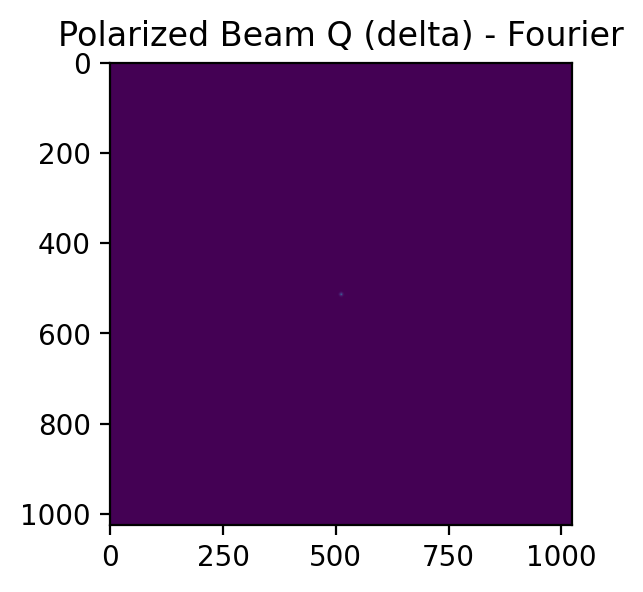

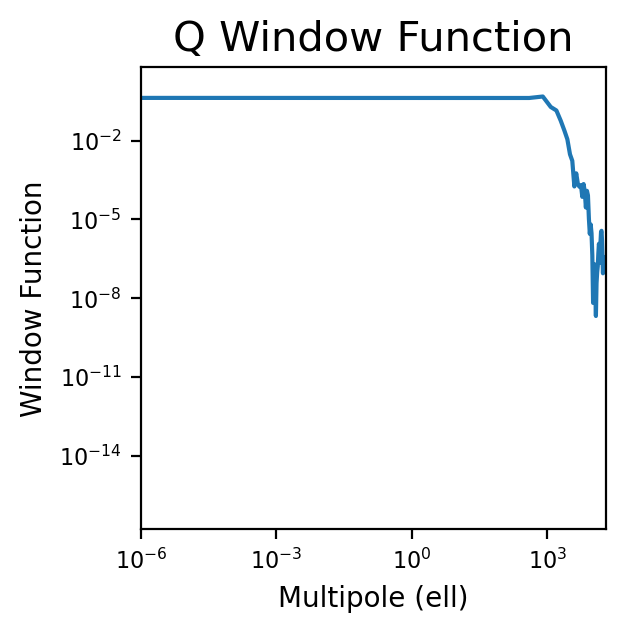

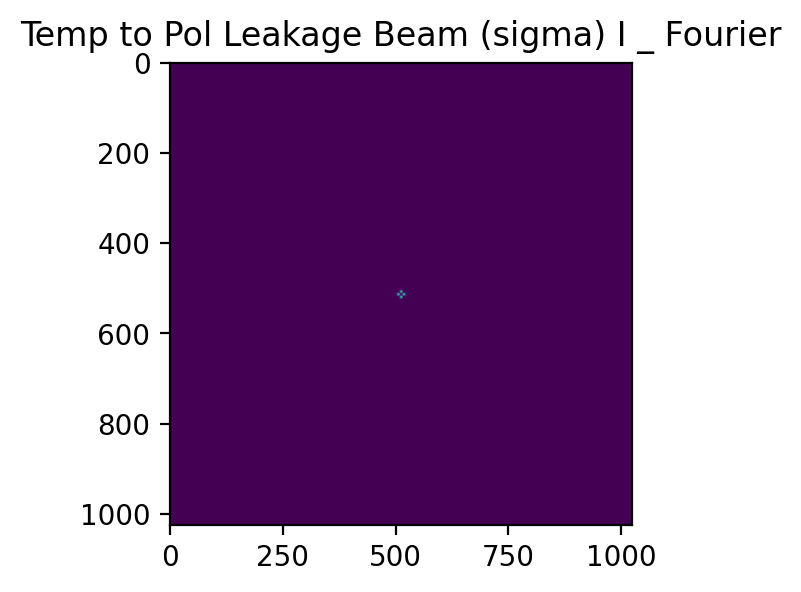

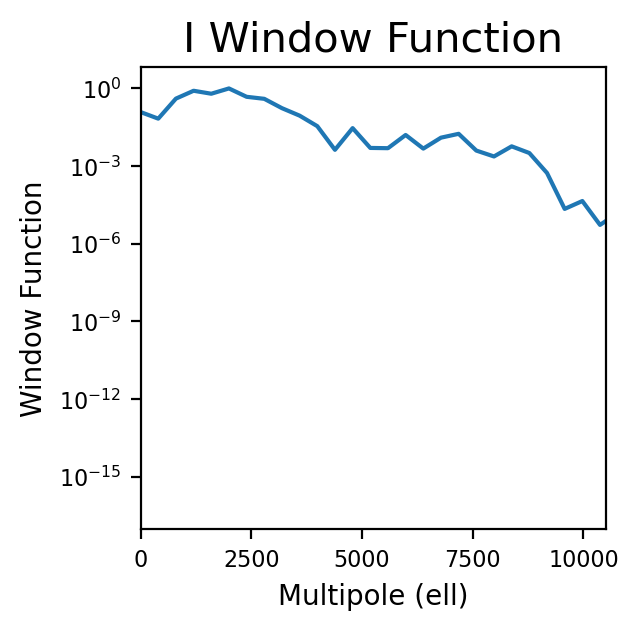

In [36]:
# WINDOW FUNCTION


# define the beam size through the telescope optics using the equation for a diffraction limited system

D = 550.0 #aperture in cm
center_frequency = 90.0  # GHz
on_sky_beam = (1.220 * 29.98 * 180.0 * 60.0) / (center_frequency * D * np.pi)  # diffraction limited system equation.

# Fourier Transform
delta_t = np.fft.fftshift(delta)
sigma_t = np.fft.fftshift(sigma)

fft_delta = np.fft.fft2(delta_t)
fft_sigma = np.fft.fft2(sigma_t)

# magnitude squared
delta_fft = np.real(fft_delta) ** 2 + np.imag(fft_delta) ** 2
delta_mag = np.fft.fftshift(delta_fft)
sigma_fft = np.real(fft_sigma) ** 2 + np.imag(fft_sigma) ** 2
sigma_mag = np.fft.fftshift(sigma_fft)

# normalize
delta_m = delta_mag / np.max(delta_mag)
sigma_m = sigma_mag / np.max(sigma_mag) # c'era scritto delta ma credo sia un errore

################################################################################################

# Bin radially to make 1D function
n_pix  = 1024
y, x   = np.indices(delta_m.shape)          
center = n_pix / 2.0                         
r      = np.hypot(x - center, y - center)    #calculates the Euclidean norm (magnitude) 180x180

# Get sorted radii
ind      = np.argsort(r.flat)  #returns the indices that sort an array
r_sorted = r.flat[ind]
delta_sorted = delta_m.flat[ind]
sigma_sorted = sigma_m.flat[ind]

# Get the integer part of the radii (bin size = 1) trasforma in int
r_int = r_sorted.astype(int)

# Find all pixels that fall within each radial bin.
deltar = r_int[1:] - r_int[:-1]  # difference between consecutive elements of r_int
rind   = np.where(deltar)[0]     # location of changed radius, quindi dove deltar è diverso da 0
nr     = rind[1:] - rind[:-1]    # difference between consecutive elements of rind


deltasim  = np.cumsum(delta_sorted, dtype=float)
deltatbin = deltasim[rind[1:]] - deltasim[rind[:-1]]
sigmasim  = np.cumsum(sigma_sorted, dtype=float)
sigmatbin = sigmasim[rind[1:]] - sigmasim[rind[:-1]]

deltarad = deltatbin / nr
sigmarad = sigmatbin / nr

delta_rad = deltarad / np.max(deltarad)
sigma_rad = sigmarad / np.max(sigmarad)

# Find how krad scales with multipole
kmax = len(delta_rad)
krad = np.linspace(0, kmax - 1, kmax)

# res is resolution in degrees
stop_angle = 13
res   = 1.0
l_rad = krad * np.pi * res * D * center_frequency / (29.98 * stop_angle)


# plots
plt.figure(figsize=(3,3))
plt.title("Polarized Beam Q (delta) - Fourier")
plt.imshow(delta_m)
plt.show()


fig, ax = plt.subplots(1, figsize=(3,3))
plt.loglog(l_rad, delta_rad)
#ax.set_ylim(0.001, 1)
ax.set_xlim(0.000001, 2e4)
for label in ax.get_xticklabels() + ax.get_yticklabels():
    label.set_fontsize(8)
ax.set_title("Q Window Function", fontsize=15)
ax.set_xlabel("Multipole (ell)", fontsize=10)
ax.set_ylabel("Window Function", fontsize=10)
plt.show()


plt.figure(figsize=(3,3))
plt.title("Temp to Pol Leakage Beam (sigma) I _ Fourier")
plt.imshow(sigma_m)
plt.show()


fig, ax = plt.subplots(1,figsize=(3,3))
plt.semilogy(l_rad, sigma_rad)
#ax.set_ylim(1.0e-9, 0.001)
ax.set_xlim(0, 10500)
for label in ax.get_xticklabels() + ax.get_yticklabels():
    label.set_fontsize(8)
ax.set_title("I Window Function", fontsize=15)
ax.set_xlabel("Multipole (ell)", fontsize=10)
ax.set_ylabel("Window Function", fontsize=10)
plt.show()


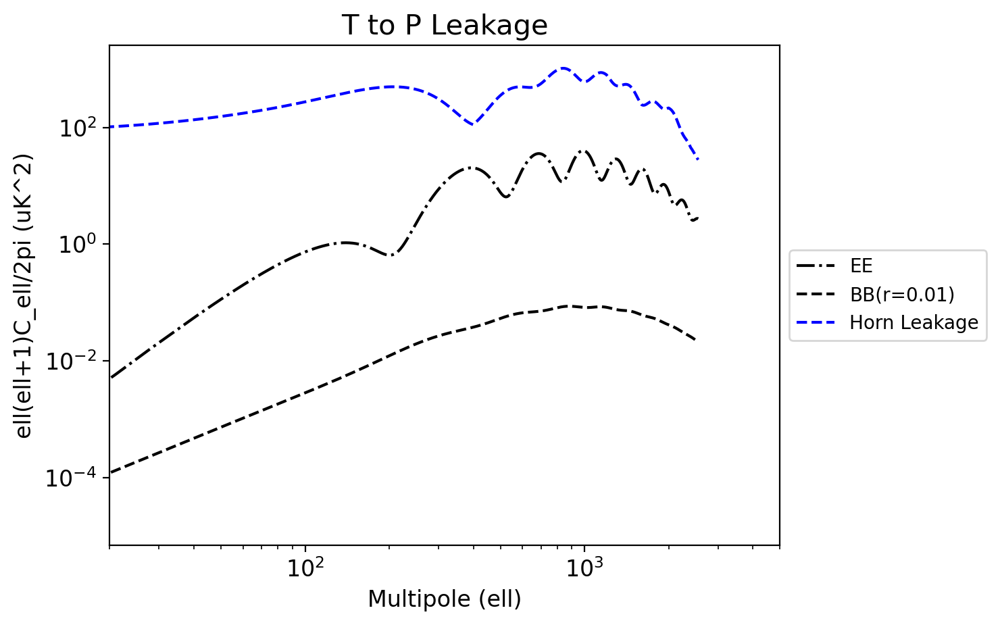

In [37]:
# MULTIPLY - apply window functions to the spectra to calculate the leakages

# Multiply by CMB spectra

# TT*I Temperature leakage
fig, ax = plt.subplots(1)

# interpolate window function to match ells from TT
ax.loglog(ls, Original_PS[2], label="EE", linestyle="-.", color="k")
ax.loglog(ls, Original_PS[3], label="BB(r=0.01)", linestyle="--", color="k")
#ax.loglog(ell_nor, bb_nor, label="BB(r=0)", color="k")

sigma1 = np.interp(ls, l_rad, sigma_rad)
TTI2   = sigma1 * Original_PS[0]


ax.loglog(ls, TTI2, color="blue", linestyle="--", label="Horn Leakage")
plt.xlim(20, 5000)
lgd = ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
for label in ax.get_xticklabels() + ax.get_yticklabels():
    label.set_fontsize(12)
ax.set_title("T to P Leakage", fontsize=15)
ax.set_xlabel("Multipole (ell)", fontsize=12)
ax.set_ylabel("ell(ell+1)C_ell/2pi (uK^2)", fontsize=12)
plt.show()


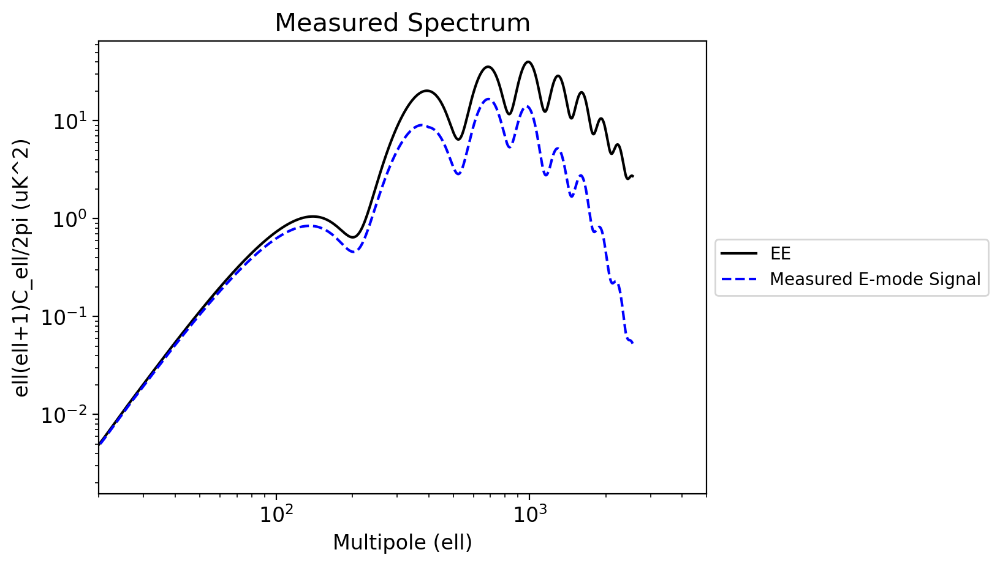

In [38]:
# Main beam
fig, ax = plt.subplots(1)

# interpolate window function to match ells from TT
ax.loglog(ls, Original_PS[2], label="EE", color="k")

delta1 = np.interp(ls, l_rad, delta_rad)
TTQ2   = delta1 * Original_PS[2]

ax.loglog(ls, TTQ2, color="blue", linestyle="--", label="Measured E-mode Signal")
plt.xlim(20, 5000)
lgd = ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
for label in ax.get_xticklabels() + ax.get_yticklabels():
    label.set_fontsize(12)
ax.set_title("Measured Spectrum", fontsize=15)
ax.set_xlabel("Multipole (ell)", fontsize=12)
ax.set_ylabel("ell(ell+1)C_ell/2pi (uK^2)", fontsize=12)
plt.show()

In [1]:
def merge_cosine(X,center=30,width=5):
    mask = np.ones(X.shape)
    mask[X>center] = 0.
    funcmsk = np.all([X>center-width/2,X<center+width/2],axis=0)
    mask[funcmsk] = (1-np.sin((X[funcmsk]-center)*np.pi/width))/2
    return mask**2

def correct_fft(init_beam, N, pix_size, FWHM):
    """
    Apply beam correction to a Gaussian using the beam model provided as an argument.

    INPUTS:
    aMap    astroMap to correct
    init_beam   astroBeam object containing a single-component or compound beam model (native dB scale)
    """
    # GET TARGET BEAM
    trgt_beam = make_2d_gaussian_beam(N,pix_size,FWHM)
    
    # GET MAP PARAMETERS
    N = int(N)
    ones = np.ones(N)
    inds = (np.arange(N)+.5 - N/2.) * pix_size
    X = np.outer(ones,inds)
    Y = np.transpose(X)
    R = np.sqrt(X**2. + Y**2.)
    #shape = aMap.MAP.value.shape
    #pixscale = np.abs(aMap.WCS.wcs.cdelt[0])*u.degree
    
    # CONDITION BEAMS TO FRACTION FORM
    init_bmap = 10**(init_beam/10)
    trgt_bmap = 10**(trgt_beam/10)
    #init_bmap = dB_to_frac(init_beam.return_bMap(pixscale=pixscale,shape=shape))
    #trgt_bmap = dB_to_frac(trgt_beam.return_bMap(pixscale=pixscale,shape=shape))
    
    # GET SPATIAL FREQUENCY INFORMATION
    #xfreq,yfreq = np.meshgrid(fftpack.fftfreq(aMap.MAP.value.shape[0], d=pixscale.to(u.arcmin).value),
                              #fftpack.fftfreq(aMap.MAP.value.shape[0], d=pixscale.to(u.arcmin).value))
    #rfreq = fftpack.fftshift(np.sqrt(xfreq**2 + yfreq**2))
    #tfreq = fftpack.fftshift(np.arctan2(xfreq,yfreq))
    #xspac,yspac = np.meshgrid(np.arange(aMap.MAP.value.shape[1])-aMap.MAP.value.shape[0]//2-1,
                              #np.arange(aMap.MAP.value.shape[0])-aMap.MAP.value.shape[1]//2-1)
    #rspac = np.sqrt(xspac**2 + yspac**2)
    
    # APPLY ENVELOPE
    rmax = np.nanmax(np.abs(X))
    center = rmax-10
    init_bmap = init_bmap * merge_cosine(R,center=center,width=20)
    
    FLOOR = 1e-15
    init_bmap = init_bmap/np.nansum(init_bmap)
    trgt_bmap = trgt_bmap/np.nansum(trgt_bmap)
    init_bmap[init_bmap<FLOOR] = FLOOR
    trgt_bmap[trgt_bmap<FLOOR] = FLOOR
    #print('!!!: ', np.nansum(trgt_bmap), np.nansum(init_bmap))
    # FFT BEAMS AND MAP
    init_bmap_fft = fftpack.fftshift(fftpack.fftn(init_bmap))
    trgt_bmap_fft = fftpack.fftshift(fftpack.fftn(trgt_bmap))
    #amap_fft = fftpack.fftshift(fftpack.fftn(aMap.MAP.value))
    '''
    CONDITION BEAM FFT
    '''
    # REASSERT NORMALISATION AND FLOOR
    #init_bmap[init_bmap<FLOOR] = FLOOR
    #trgt_bmap[trgt_bmap<FLOOR] = FLOOR
    #init_bmap = init_bmap/np.nansum(init_bmap)
    #trgt_bmap = trgt_bmap/np.nansum(trgt_bmap)

    # COMPUTE TRANSFER FUNCTION
    #trnsfr_fft = trgt_bmap_fft/init_bmap_fft
    '''
    CORRECT TRANSFER FFT
    '''

    # RADIALLY AVERAGE
    #xs = 10**np.linspace(-3,0,1001)
    #h,y,ye = statbin(np.log10(rfreq),np.abs(trnsfr_fft),np.log10(xs),
                     #width=1*(np.log10(xs[1])-np.log10(xs[0])),mirror=False)
    # MASK AND INTERPOLATE MID-SECTION
    #mask = np.where((ye/y)>0.1)[0]
    #from itertools import groupby, count
    #mask = [list(g) for k, g in groupby(mask, key=lambda i,j=count(): i-next(j))]
    #print(len(mask))

    # Remove vertical/horizontal standing waves through interpolating over these pixels
    #trnsfr_fft_interpd = np.zeros(trnsfr_fft.shape)
    #trnsfr_fft_interpd[:] = trnsfr_fft[:]
    # COMPUTE MAP FFT
    #fmap_fft = amap_fft*trnsfr_fft_interpd
    '''
    CORRECT MAP FFT
    '''
    # GET STANDARD DEVIATIONS OF NEAT GAUSSIAN AND FFT'ED GAUSSIAN
    #gauss_std = aMap.RESO.to(u.arcmin).value/2.355
    #fft_gauss_std = 1/(2*np.pi*gauss_std)
    #val = filt_val*fft_gauss_std*2.355
    #wid = filt_width*fft_gauss_std*2.355
    #env = merge_cosine(rfreq,
                        #val,
                        #wid)
    #fmap_fft2 = fmap_fft*(env + (1-env)*(1e-13/np.abs(fmap_fft)))
    # fmap_fft2[rfreq>0.2075] = 0.


    
    return init_bmap_fft#, trnsfr_fft_interpd, [xs,y]
